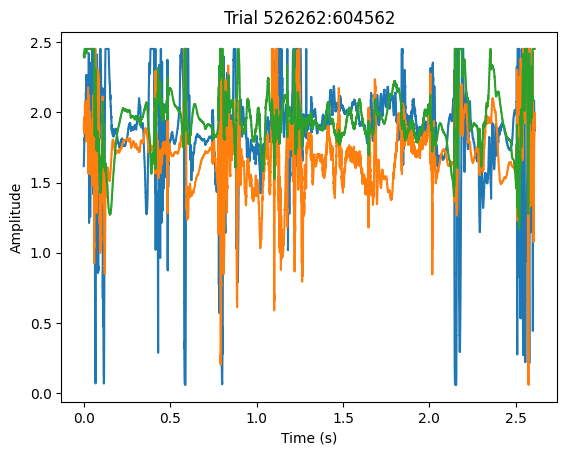

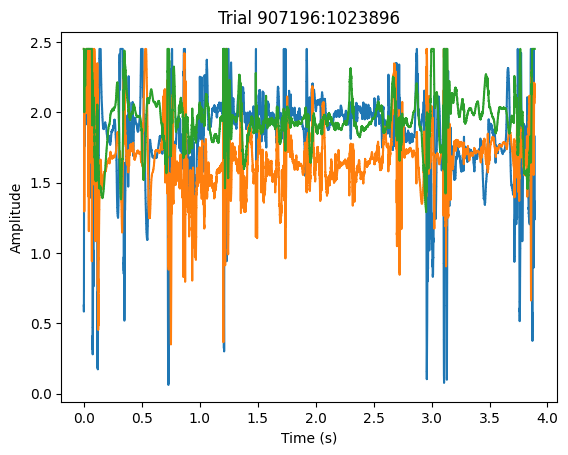

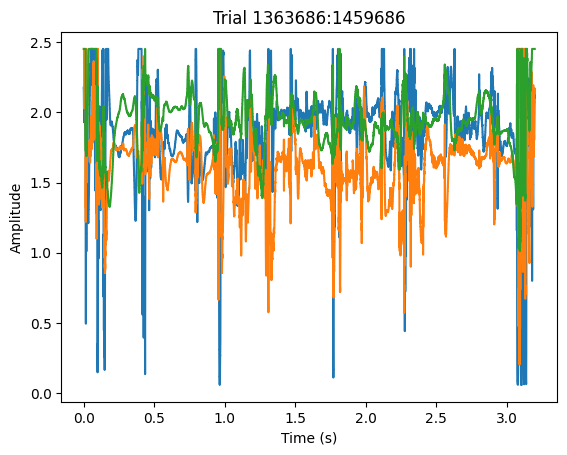

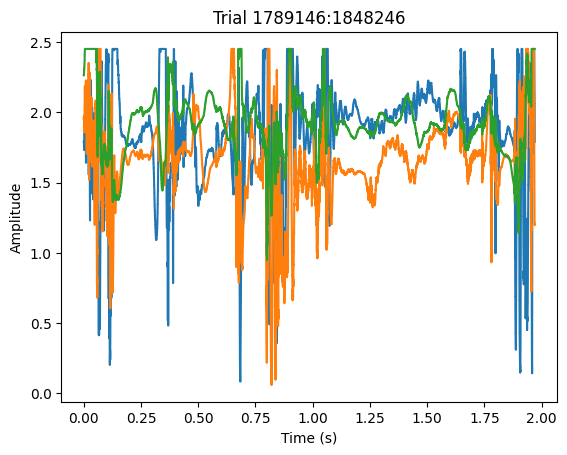

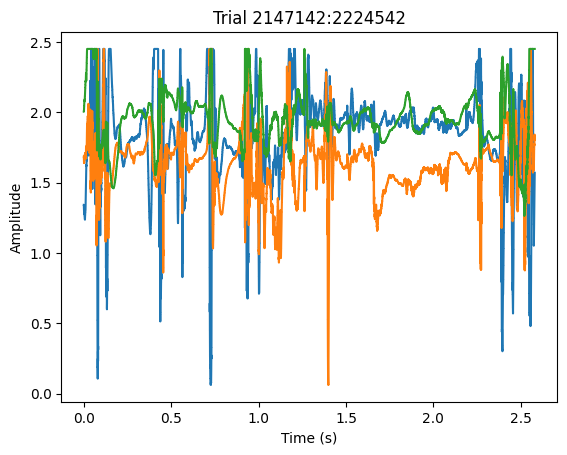

...

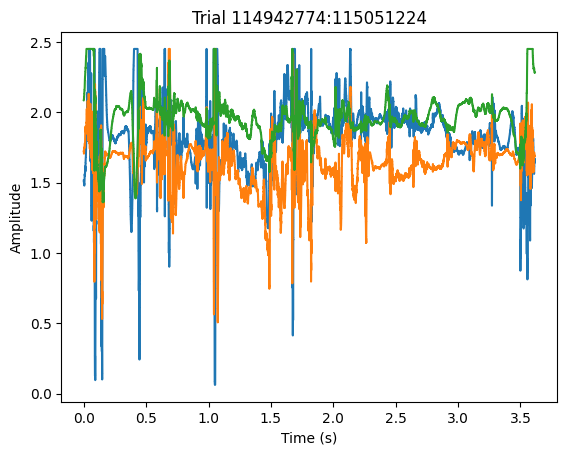

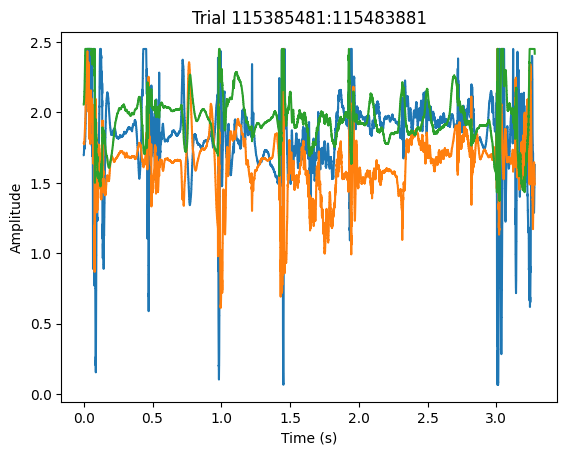

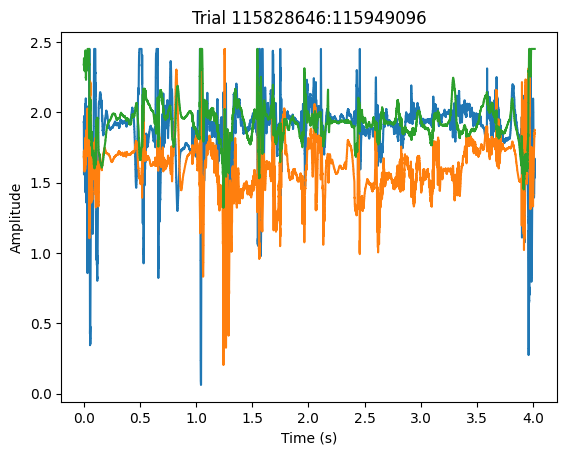

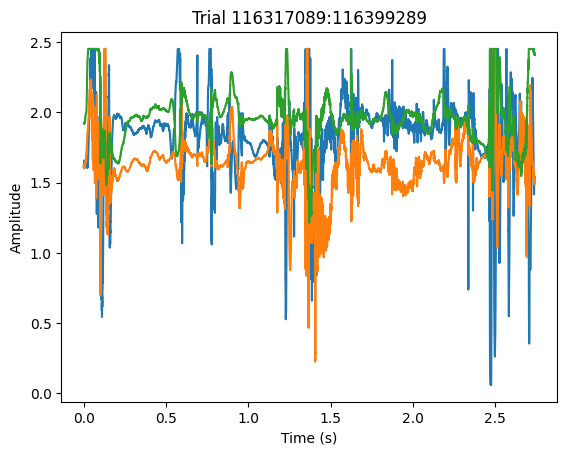

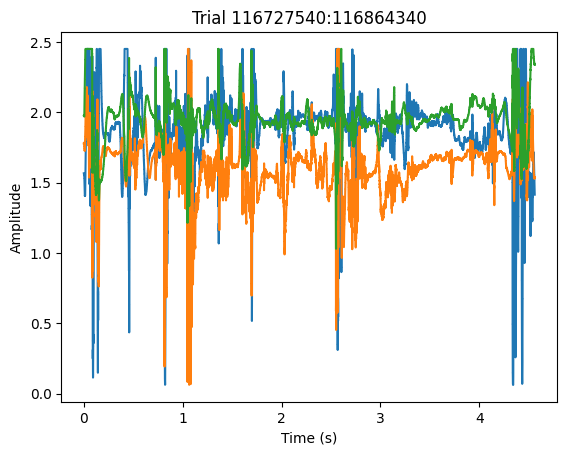

In [30]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

from ethograph.io.ephys_loader import load_ephys

path_labels = r"C:\Users\aksel\Desktop\POPPY_LABEL\ses-000_date-20260308_01\behav\Trial_data_labels.tsv"
path_rhd = r"C:\Users\aksel\Desktop\POPPY_LABEL\raw\ephys\Poppy_260308_115737\info.rhd"
sr = 30_000

df = pd.read_csv(path_labels, sep="\t")
start_idx = (df[df.labels == 1].drop_duplicates("trial", keep="first")["onset_global"] * sr).astype(int)
end_idx = (df[df.labels == 10].drop_duplicates("trial", keep="first")["offset_global"] * sr).astype(int)

loader = load_ephys(path_rhd, stream_id="1")

for s, e in zip(start_idx, end_idx):
    trace = loader[s:e]
    t = np.arange(len(trace)) / sr
    plt.plot(t, trace)
    plt.xlabel("Time (s)")
    plt.ylabel("Amplitude")
    plt.title(f"Trial {s}:{e}")
    plt.show()